In [1]:
Fs = 1000
Ts = 1/Fs
n = -4000:4000
t = n .* Ts

#прямоугольное окно
x1(t) = (0<=t<=2) ? 1 : 0
#треугольное окно
function x2(t)
    if 0<=t<1
        return t
    elseif 1<=t<=2
        return 2-t
    else
        return 0
    end
end
#синусоидальный сигнал
x3(t) = (0<=t<=2) ? sin(2*pi*t) : 0

X1, X2, X3 = x1.(t), x2.(t), x3.(t)

using Plots
function plot_result(data, title, is_conv)
    
    if (is_conv)
        ox = "Индекс n"
    else

        ox = "Сдвиг"
    end
    n_co = (first(n) + first(n)):(last(n) + last(n))
    p = scatter(n_co, data, title=title, label=(is_conv) ? "y[n]" : "r[n]", linewidth=2,
    markersize = 2,markerstrokewidth = 0, color=:indigo, 
    xlabel= ox, ylabel="Амплитуда", legend =:topleft)
    display(p)
end



plot_result (generic function with 1 method)

In [ ]:
function convolution(x, h)
    N = length(x)
    M = length(h)
    len = N + M - 1
    y = zeros(len)
    for n in 1:len
        for k in 1:N
            if 1 <= (n-k+1) <= M
                y[n] += x[k]*h[n-k+1]
            end 
        end
    end
    return y
end

function correlation(x, h)
    N = length(x)
    M = length(h)
    len = N + M - 1
    r = zeros(len)
    for m in 1:len
        lag = m - M
        for n in 1:N
            j = n - lag
            if 1 <= j <= M
                r[m] += x[n]*h[j]
            end
        end
    end
    
    return r
end

correlation (generic function with 1 method)

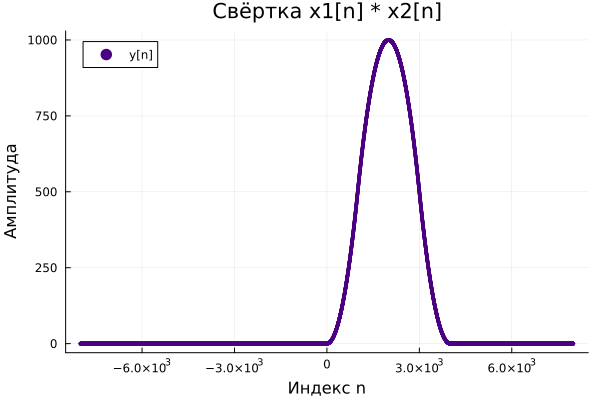

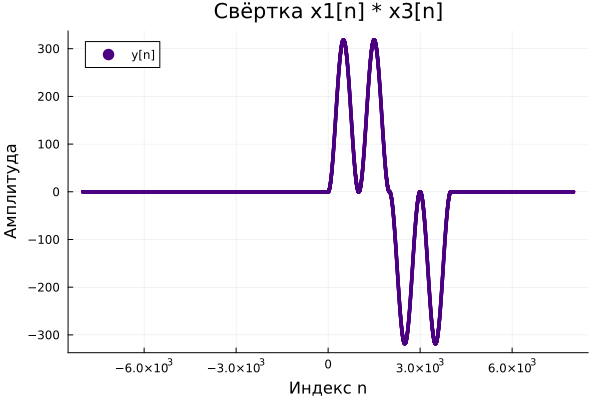

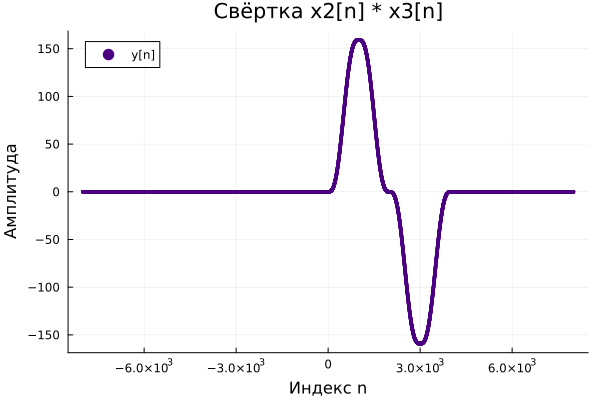

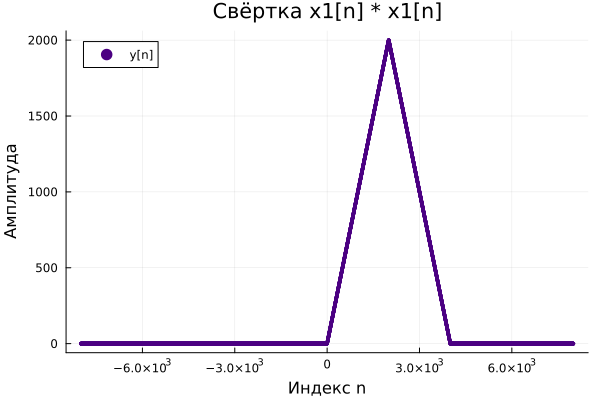

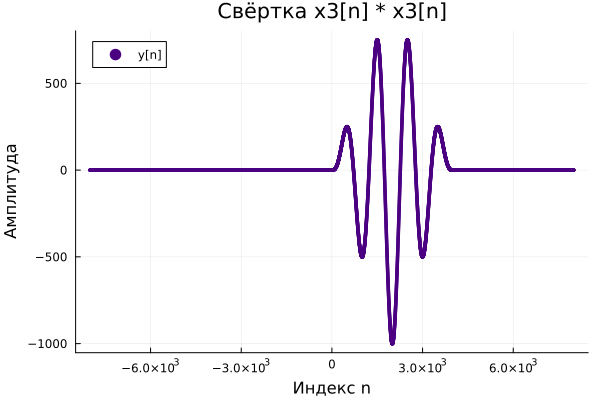

In [3]:
conv_x1_x2 = convolution(X1, X2)
conv_x1_x3 = convolution(X1, X3)
conv_x2_x3 = convolution(X2, X3)
conv_x1_x1 = convolution(X1, X1)
conv_x3_x3 = convolution(X3, X3)

plot_result(conv_x1_x2, "Свёртка x1[n] * x2[n]", true)
plot_result(conv_x1_x3, "Свёртка x1[n] * x3[n]", true)
plot_result(conv_x2_x3, "Свёртка x2[n] * x3[n]", true)
plot_result(conv_x1_x1, "Свёртка x1[n] * x1[n]", true)
plot_result(conv_x3_x3, "Свёртка x3[n] * x3[n]", true)
